In [1]:
# https://www.kaggle.com/code/kalibrahim/audio-processing-features-cnn-training/notebook
# https://www.kaggle.com/datasets/andradaolteanu/gtzan-dataset-music-genre-classification/code

In [2]:
# Run autocomplete
%config Completer.use_jedi=False

In [3]:
#Libraries we will need.
import pandas as pd
import matplotlib.pyplot as plt
import librosa
import librosa.display
from tqdm import tqdm
import numpy as np
from sklearn.model_selection import train_test_split
import tensorflow as tf
import tensorflow.keras.models as models
import tensorflow.keras.layers as layers
import IPython.display as ipd
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"
import os

%matplotlib inline
%load_ext tensorboard

2022-05-10 18:41:43.931411: I tensorflow/stream_executor/platform/default/dso_loader.cc:49] Successfully opened dynamic library libcudart.so.10.1


In [4]:
path_files = r'/home/jest/Documents/personal/repositories/Data/genres_original'

In [5]:
sample = path_files + '/blues/blues.00021.wav'
x,freq = librosa.load(sample)
sr=freq

In [6]:
print(x.shape)
print(type(x))
print(freq)
print(type(freq))

(661794,)
<class 'numpy.ndarray'>
22050
<class 'int'>


In [7]:
ipd.Audio(sample)

In [8]:
ipd.Audio(x, rate= sr)

<Figure size 720x216 with 0 Axes>

Text(0.5, 1.0, 'Single Bark Wave Plot')

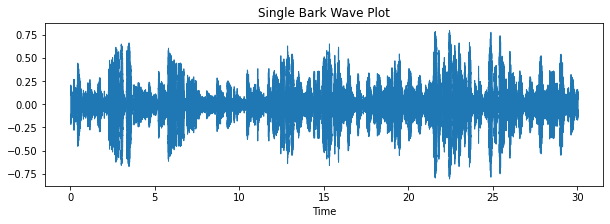

In [9]:
plt.figure(figsize=(10,3))
plt.title("Single Bark Wave Plot")
librosa.display.waveshow(x,sr=freq)

<Figure size 1440x576 with 0 Axes>

Text(0.5, 1.0, 'Multi Bark Sound Spectogram')

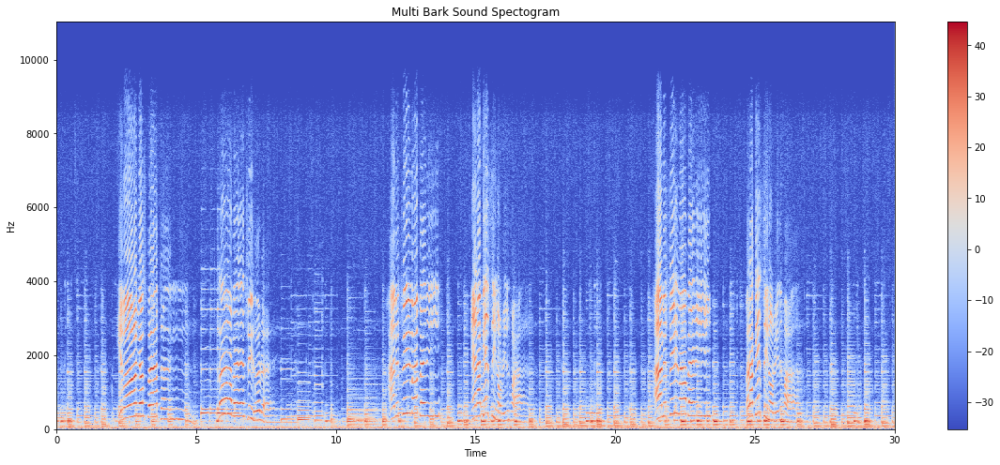

In [10]:
# espectograma
X=librosa.stft(x) #stft -> Short-time Fourier transform
X_db=librosa.amplitude_to_db(abs(X)) #Translation from amplitude to desibel(db) value
plt.figure(figsize=(20,8))
librosa.display.specshow(X_db, sr=sr,x_axis="time",y_axis="hz")
plt.title("Multi Bark Sound Spectogram")
plt.colorbar()

In [11]:
# Separación percusiva armonica

In [12]:
data_h, data_p = librosa.effects.hpss(x)
spec_h = librosa.feature.melspectrogram(data_h, sr=sr)
spec_p = librosa.feature.melspectrogram(data_p, sr=sr)
db_spec_h = librosa.power_to_db(spec_h,ref=np.max)
db_spec_p = librosa.power_to_db(spec_p,ref=np.max)

/tmp/ipykernel_55842/1684710432.py:2: FutureWarning: Pass y=[ 0.02849129  0.03742592  0.03485174 ... -0.06749176 -0.06639373
 -0.0598563 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  spec_h = librosa.feature.melspectrogram(data_h, sr=sr)
/tmp/ipykernel_55842/1684710432.py:3: FutureWarning: Pass y=[ 0.01862784  0.0376168   0.03103571 ... -0.02467132 -0.02821076
 -0.0285226 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  spec_p = librosa.feature.melspectrogram(data_p, sr=sr)


In [13]:

ipd.Audio(x, rate= sr)

In [14]:
ipd.Audio(data_h,rate=sr) 

Text(0.5, 1.0, 'Harmonic Mel Spectogram')

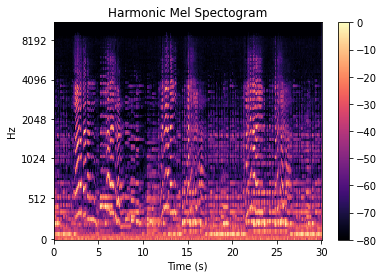

In [15]:
librosa.display.specshow(db_spec_h,y_axis='mel', x_axis='s', sr=sr)
plt.title("Harmonic Mel Spectogram")
plt.colorbar()

In [16]:
ipd.Audio(data_p,rate=sr) 

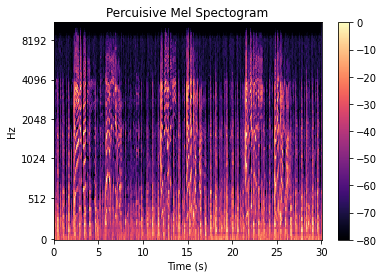

In [17]:
librosa.display.specshow(db_spec_p,y_axis='mel', x_axis='s', sr=sr)
plt.title("Percuisive Mel Spectogram")
plt.colorbar();

In [18]:
#3.3 Mel-Frequency Cepstral Coefficients (MFCC)

shape of mfcc: (20, 1293)


/tmp/ipykernel_55842/709328783.py:1: FutureWarning: Pass y=[ 0.04711914  0.07504272  0.06588745 ... -0.09216309 -0.09460449
 -0.08837891] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  mfcc=librosa.feature.mfcc(x,sr=sr)


<Figure size 1080x432 with 0 Axes>

Text(0.5, 1.0, 'Mel-Frequency Cepstral Coefficients')

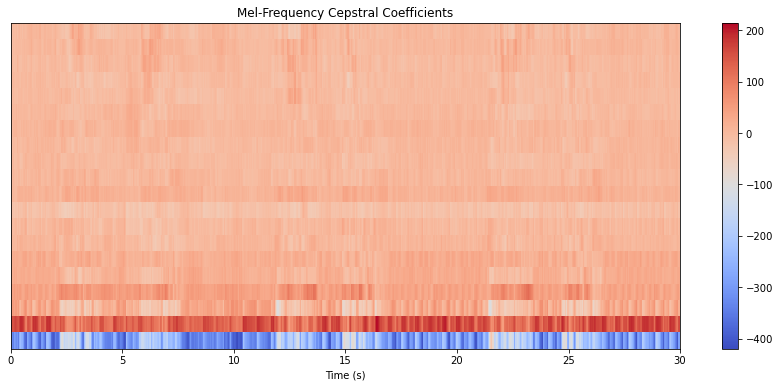

In [19]:
mfcc=librosa.feature.mfcc(x,sr=sr)
print("shape of mfcc:" ,mfcc.shape)


plt.figure(figsize=(15,6))
librosa.display.specshow(mfcc,x_axis="s")
plt.title("Mel-Frequency Cepstral Coefficients")
plt.colorbar()

In [20]:
#3.4 Zero Crossing Rate (ZCR)

In [21]:
zero_crossing=librosa.zero_crossings(x)
print("Type of Zero Crossing Rate",type(zero_crossing))
print(zero_crossing, " --> See it contains booleans")
print("Total Number of Zero Crossing is: ",sum(zero_crossing))

Type of Zero Crossing Rate <class 'numpy.ndarray'>
[ True False False ... False False False]  --> See it contains booleans
Total Number of Zero Crossing is:  31736


<Figure size 1080x360 with 0 Axes>

Text(0.5, 1.0, 'Zero Crossing Rate')

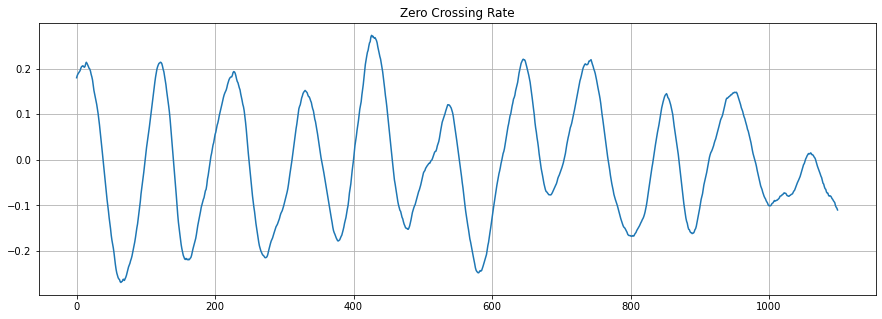

In [22]:
plt.figure(figsize=(15,5))
plt.title("Zero Crossing Rate")
plt.plot(x[4000:5100])
plt.grid()

In [23]:
# 3.5 Spectral Centroid

(1, 1293)


/tmp/ipykernel_55842/1401322769.py:1: FutureWarning: Pass y=[ 0.04711914  0.07504272  0.06588745 ... -0.09216309 -0.09460449
 -0.08837891] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  spec_cent=librosa.feature.spectral_centroid(x)


<Figure size 1080x360 with 0 Axes>

Text(0.5, 1.0, 'Spectral Centroid')

Text(0, 0.5, 'Hz')

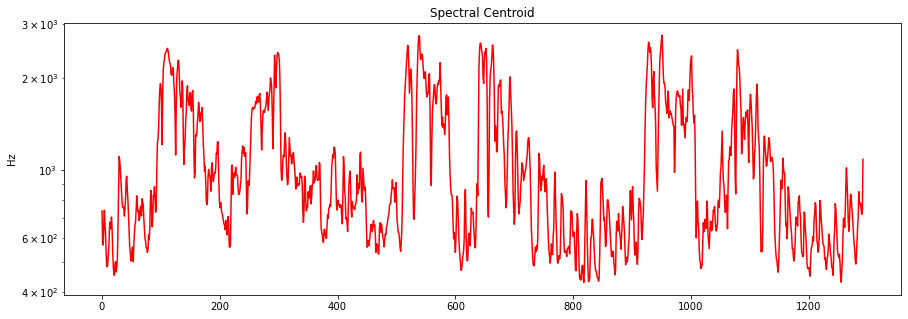

In [24]:
spec_cent=librosa.feature.spectral_centroid(x)
print(spec_cent.shape)

plt.figure(figsize=(15,5))
plt.title("Spectral Centroid")
plt.semilogy(spec_cent.T, "r")
plt.ylabel("Hz")

In [25]:
# 3.6 Spectral Roll off

(1, 1293)


/tmp/ipykernel_55842/3635181036.py:1: FutureWarning: Pass y=[ 0.04711914  0.07504272  0.06588745 ... -0.09216309 -0.09460449
 -0.08837891] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  spec_roll=librosa.feature.spectral_rolloff(x,sr=sr)


<Figure size 1080x360 with 0 Axes>

Text(0.5, 1.0, 'Spectral Roll off')

Text(0, 0.5, 'Hz')

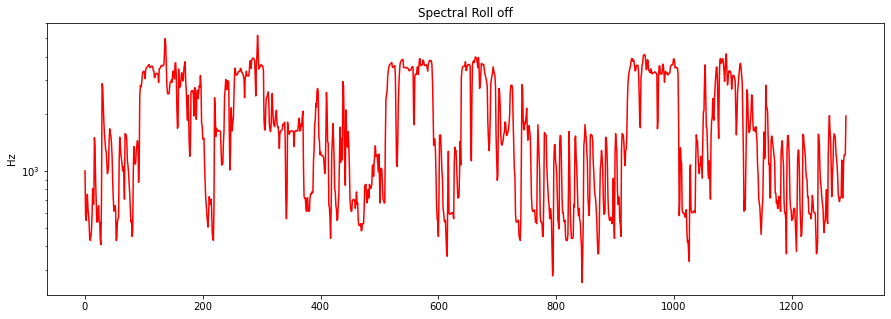

In [26]:
spec_roll=librosa.feature.spectral_rolloff(x,sr=sr)
print(spec_roll.shape)

plt.figure(figsize=(15,5))
plt.title("Spectral Roll off")
plt.semilogy(spec_roll.T,"r")
plt.ylabel("Hz")

In [27]:
# 3.7 Chroma Feature

<Figure size 720x288 with 0 Axes>

Text(0.5, 1.0, 'Chromagram')

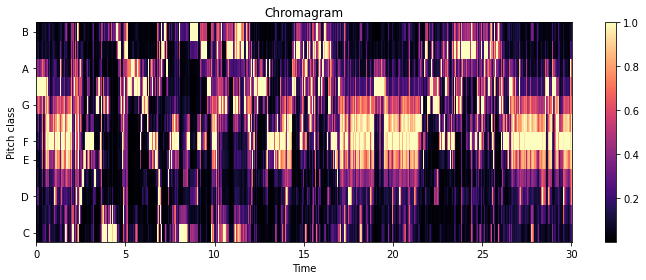

In [28]:
y, sr = librosa.load(sample)
chroma=librosa.feature.chroma_stft(y=y, sr=sr)
plt.figure(figsize=(10, 4))
librosa.display.specshow(chroma, y_axis='chroma', x_axis='time')
plt.colorbar()
plt.title('Chromagram')
plt.tight_layout()

In [29]:
# 3.7 Spectral Bandwidth

In [30]:
spec_band=librosa.feature.spectral_bandwidth(x,sr=sr)
print("Spectral Bandwidth Shape: ",spec_band.shape)
print("Spectral Bandwidth: ", spec_band)

Spectral Bandwidth Shape:  (1, 1293)
Spectral Bandwidth:  [[1501.56051181 1263.53760818 1255.33333912 ... 1311.26906482
  1448.18839217 2052.48545128]]


/tmp/ipykernel_55842/769803642.py:1: FutureWarning: Pass y=[ 0.04711914  0.07504272  0.06588745 ... -0.09216309 -0.09460449
 -0.08837891] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  spec_band=librosa.feature.spectral_bandwidth(x,sr=sr)


In [31]:
# 3.8 Root Mean Squared Energy

In [32]:
x,sr = librosa.load(sample)

(1, 1289)


Text(0.5, 1.0, 'Root Mean Squared Energy & log Pawer Spectogram')

[[]]

[Text(0.5, 1.0, 'log Power spectrogram')]

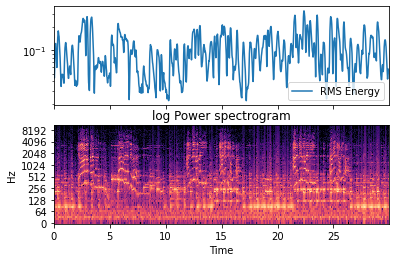

In [33]:
S = librosa.magphase(librosa.stft(x, window=np.ones, center=False))[0]
RMSEn= librosa.feature.rms(S=S)
print(RMSEn.shape)


fig, ax = plt.subplots(nrows=2, sharex=True)
times = librosa.times_like(RMSEn)
plt.title("Root Mean Squared Energy & log Pawer Spectogram")
ax[0].semilogy(times, RMSEn[0], label='RMS Energy')
ax[0].set(xticks=[])
ax[0].legend()
ax[0].label_outer()
librosa.display.specshow(librosa.amplitude_to_db(S, ref=np.max), y_axis='log', x_axis='time', ax=ax[1])
ax[1].set(title='log Power spectrogram')
plt.show()

# NEURAL NETWORK

In [34]:
### armando dataframe con carpetas y archivos 
path_audios = r'/home/jest/Documents/personal/repositories/Data/genres_original'
os.chdir(path_audios)  
files_list = os.listdir()
data_audios = pd.DataFrame()
for i in range(len(files_list)):
    list_sounds = os.listdir( os.getcwd() + '/' +  files_list[i])
    df_temp = pd.DataFrame({'file_name': list_sounds})
    df_temp = df_temp.assign(genre = files_list[i])
    df_temp = df_temp.assign(category = i)    
    data_audios = pd.concat([data_audios, df_temp], axis =0, ignore_index=True) 


In [35]:
data_audios.head()

,file_name,genre,category
0,hiphop.00037.wav,hiphop,0
1,hiphop.00036.wav,hiphop,0
2,hiphop.00005.wav,hiphop,0
3,hiphop.00017.wav,hiphop,0
4,hiphop.00047.wav,hiphop,0


In [36]:
classes = data_audios['category'].unique()
print("Classes are: ",classes)
print("# of Classes are: ",classes.shape[0])

Classes are:  [0 1 2 3 4 5 6 7 8 9]
# of Classes are:  10


In [37]:
class_dict = {i:x for x,i in enumerate(classes)}


In [38]:
#drop duplicates if there are any in filename...
data_audios = data_audios.drop_duplicates(subset=['file_name'])

In [39]:
data_audios['target'] = data_audios['category'].map(class_dict)
data_audios.head()
print("data_audios shape: ", data_audios.shape)

,file_name,genre,category,target
0,hiphop.00037.wav,hiphop,0,0
1,hiphop.00036.wav,hiphop,0,0
2,hiphop.00005.wav,hiphop,0,0
3,hiphop.00017.wav,hiphop,0,0
4,hiphop.00047.wav,hiphop,0,0


data_audios shape:  (1000, 4)


In [40]:
X = []
y = []

In [41]:
import warnings

In [42]:
warnings.filterwarnings("ignore")

In [43]:
for data in data_audios.iterrows():# tqdm(data_audios.iterrows(),  desc='Progress'):
     print(path_audios+ '/' +data[1][0])

/home/jest/Documents/personal/repositories/Data/genres_original/hiphop.00037.wav
/home/jest/Documents/personal/repositories/Data/genres_original/hiphop.00036.wav
/home/jest/Documents/personal/repositories/Data/genres_original/hiphop.00005.wav
/home/jest/Documents/personal/repositories/Data/genres_original/hiphop.00017.wav
/home/jest/Documents/personal/repositories/Data/genres_original/hiphop.00047.wav
/home/jest/Documents/personal/repositories/Data/genres_original/hiphop.00024.wav
/home/jest/Documents/personal/repositories/Data/genres_original/hiphop.00009.wav
/home/jest/Documents/personal/repositories/Data/genres_original/hiphop.00098.wav
/home/jest/Documents/personal/repositories/Data/genres_original/hiphop.00095.wav
/home/jest/Documents/personal/repositories/Data/genres_original/hiphop.00048.wav
/home/jest/Documents/personal/repositories/Data/genres_original/hiphop.00089.wav
/home/jest/Documents/personal/repositories/Data/genres_original/hiphop.00062.wav
/home/jest/Documents/persona

In [44]:
data[1]

file_name    blues.00073.wav
genre                  blues
category                   9
target                     9
Name: 999, dtype: object

In [45]:
%%time
for data in data_audios.iterrows():# tqdm(data_audios.iterrows(),  desc='Progress'):
     # print(path_audios+ '/' +data[1][0])
    if data[1][0] not in ['jazz.00054.wav']:  #list  wrong audios
        sig , sr = librosa.load(path_audios+ '/' + data[1][1] + '/' +data[1][0])
        mfcc_ = librosa.feature.mfcc(sig , sr=sr, n_mfcc=40)
        X.append(mfcc_)
        y.append(data[1][2])

CPU times: user 3min 26s, sys: 2.17 s, total: 3min 29s
Wall time: 52.4 s


In [46]:
# adjunst shapes for mfcc_
min_x = min( [ele.shape[0] for ele in X])
min_y = min( [ele.shape[1] for ele in X])

In [47]:
for idx, arr in enumerate(X):
    X[idx] = arr[:min_x, :min_y]

In [48]:
X = np.array(X) 
y = np.array(y)

In [49]:
X.shape

(999, 40, 1290)

In [50]:
y.shape

(999,)

In [51]:
y = tf.keras.utils.to_categorical(y , num_classes=50)
X = X.reshape(X.shape[0], X.shape[1], X.shape[2], 1)

In [52]:
print("X Shape is: ", X.shape)
print("y Shape is: ", y.shape)

X Shape is:  (999, 40, 1290, 1)
y Shape is:  (999, 50)


In [53]:
X_train , X_test , y_train , y_test = train_test_split(X , y ,test_size=0.2, random_state=42)

In [54]:
INPUTSHAPE = (40, 1290, 1)  # get de last print output

In [55]:
model =  models.Sequential([
    
                          layers.Conv2D(32 , (3,3),activation = 'relu',padding='valid', input_shape = INPUTSHAPE),  
                          layers.MaxPooling2D(2, padding='same'),
                          layers.Conv2D(128, (3,3), activation='relu',padding='valid'),
                          layers.MaxPooling2D(2, padding='same'),
                          layers.Dropout(0.3),
                          layers.Conv2D(128, (3,3), activation='relu',padding='valid'),
                          layers.MaxPooling2D(2, padding='same'),
                          layers.Dropout(0.3),
                          layers.GlobalAveragePooling2D(),
                          layers.Dense(512 , activation = 'relu'),
                          layers.Dense(50 , activation = 'softmax')
])

model.compile(loss = 'categorical_crossentropy', optimizer = 'adam', metrics = 'acc')
model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 38, 1288, 32)      320       
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 19, 644, 32)       0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 17, 642, 128)      36992     
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 9, 321, 128)       0         
_________________________________________________________________
dropout (Dropout)            (None, 9, 321, 128)       0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 7, 319, 128)       147584    
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 4, 160, 128)       0

2022-05-10 18:42:47.847719: I tensorflow/compiler/jit/xla_cpu_device.cc:41] Not creating XLA devices, tf_xla_enable_xla_devices not set
2022-05-10 18:42:47.849106: W tensorflow/stream_executor/platform/default/dso_loader.cc:60] Could not load dynamic library 'libcuda.so.1'; dlerror: libcuda.so.1: cannot open shared object file: No such file or directory
2022-05-10 18:42:47.849175: W tensorflow/stream_executor/cuda/cuda_driver.cc:326] failed call to cuInit: UNKNOWN ERROR (303)
2022-05-10 18:42:47.849280: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (jest): /proc/driver/nvidia/version does not exist
2022-05-10 18:42:47.850076: I tensorflow/core/platform/cpu_feature_guard.cc:142] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2 AVX AVX2 FMA
To enable them in other operations, rebuild TensorFlow w

In [65]:
batch_size = 8
callback = tf.keras.callbacks.EarlyStopping(
    monitor='val_loss', min_delta=0, patience=8, verbose=0, mode='auto',
    baseline=None, restore_best_weights=False)

history = model.fit(X_train,y_train ,
            validation_data=(X_test,y_test),
            epochs=100,
            callbacks = [callback],batch_size=batch_size)

Epoch 1/100
100/100 [==============================] - 46s 460ms/step - loss: 1.3601 - acc: 0.4793 - val_loss: 1.5749 - val_acc: 0.4000
Epoch 2/100
100/100 [==============================] - 46s 462ms/step - loss: 1.2770 - acc: 0.5131 - val_loss: 1.2908 - val_acc: 0.5350
Epoch 3/100
100/100 [==============================] - 45s 455ms/step - loss: 1.1971 - acc: 0.5620 - val_loss: 1.2822 - val_acc: 0.5350
Epoch 4/100
100/100 [==============================] - 46s 457ms/step - loss: 1.0475 - acc: 0.6295 - val_loss: 1.1361 - val_acc: 0.5800
Epoch 5/100
100/100 [==============================] - 46s 456ms/step - loss: 1.0520 - acc: 0.6083 - val_loss: 1.2626 - val_acc: 0.5350
Epoch 6/100
100/100 [==============================] - 46s 459ms/step - loss: 1.0573 - acc: 0.6183 - val_loss: 1.1943 - val_acc: 0.5750
Epoch 7/100
100/100 [==============================] - 45s 455ms/step - loss: 0.9531 - acc: 0.6596 - val_loss: 1.0459 - val_acc: 0.6050
Epoch 8/100
100/100 [===========================

In [72]:
model.save_weights(r'/home/jest/Documents/personal/repositories/Data/pesos')

Text(0.5, 1.0, 'model accuracy')

Text(0, 0.5, 'accuracy')

Text(0.5, 0, 'epoch')

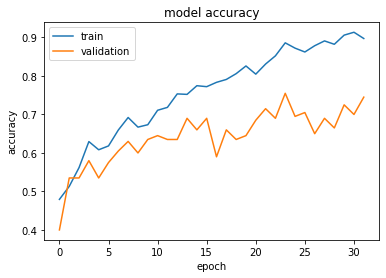

Text(0.5, 1.0, 'model loss')

Text(0, 0.5, 'loss')

Text(0.5, 0, 'epoch')

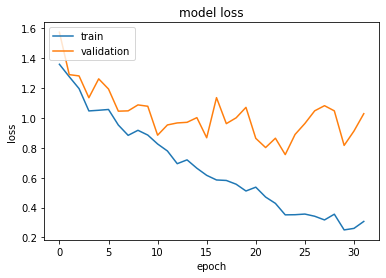

In [70]:
import matplotlib.pyplot as plt
plt.plot(history.history['acc'])
plt.plot(history.history['val_acc'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'validation'], loc='upper left')
plt.show()


plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'validation'], loc='upper left')
plt.show()

In [58]:
# validando modelo

In [74]:
y_pred = model.predict(X_test)

In [75]:
y_ = [np.argmax(ele) for ele in y_pred]
y = [np.argmax(ele) for ele in y_test]

confusion = tf.math.confusion_matrix(labels = y, predictions = y_)

In [76]:
print(confusion)

tf.Tensor(
[[19  0  0  0  0  0  0  0  1  1]
 [ 0 11  0  0  0  0  0  0  1  0]
 [ 0  2 18  1  0  2  0  0  1  0]
 [ 2  2  1 14  0  2  1  0  0  0]
 [ 0  0  3  0 12  0  0  0  0  0]
 [ 3  1  2  1  1 17  0  1  1  1]
 [ 0  2  1  0  0  0 11  3  0  0]
 [ 0  0  0  0  0  0  0 19  0  0]
 [ 0  1  3  1  0  1  0  1 15  0]
 [ 0  3  4  0  0  0  0  0  0 13]], shape=(10, 10), dtype=int32)


In [62]:
# validación manual

In [82]:
x_val_test = X_test[num]

In [86]:
x_val_test = x_val_test.reshape(x_val_test.shape[0], x_val_test.shape[1])

In [87]:
x_val_test.shape

(40, 1290)

In [95]:
num = 150
print(' prediccion ' + str(np.argmax(y_pred[num])))
print(' real ' + str(np.argmax(y_test[num])))
sig , sr = librosa.load(path_audios+ '/' + data_audios.loc[num].genre + '/' +data_audios.loc[num].file_name)
print(data_audios.loc[num].genre)
#print(data_audios.loc[num].category)
ipd.Audio(sig, rate= sr)

 prediccion 5
 real 2
country


In [ ]:
data_audios.loc[123]

In [90]:
data_audios.head()

,file_name,genre,category,target
0,hiphop.00037.wav,hiphop,0,0
1,hiphop.00036.wav,hiphop,0,0
2,hiphop.00005.wav,hiphop,0,0
3,hiphop.00017.wav,hiphop,0,0
4,hiphop.00047.wav,hiphop,0,0


In [135]:
num = 296
folder_ = data_audios.loc[num][1]
file_test = data_audios.loc[num][0]
sig , sr = librosa.load(path_audios+ '/' +folder_ + '/' +file_test)
ipd.Audio(sig, rate= sr)
print(data_audios.loc[num])
mfcc_ = librosa.feature.mfcc(sig , sr=sr, n_mfcc=40)
# nivelando dimensiones
mfcc_ = mfcc_[:min_x, :min_y]
mfcc_ = mfcc_.reshape(mfcc_.shape[0], mfcc_.shape[1], 1)
print(f'Categoria predict: {np.argmax(model.predict(np.array([mfcc_])))}')

file_name    rock.00084.wav
genre                  rock
category                  2
target                    2
Name: 296, dtype: object
Categoria predict: 2


In [136]:
data_audios.genre.unique()
data_audios.loc[data_audios.genre == 'rock']

array(['hiphop', 'country', 'rock', 'pop', 'metal', 'reggae', 'jazz',
       'classical', 'disco', 'blues'], dtype=object)

,file_name,genre,category,target
200,rock.00023.wav,rock,2,2
201,rock.00034.wav,rock,2,2
202,rock.00078.wav,rock,2,2
203,rock.00011.wav,rock,2,2
204,rock.00041.wav,rock,2,2
...,...,...,...,...
295,rock.00094.wav,rock,2,2
296,rock.00084.wav,rock,2,2
297,rock.00080.wav,rock,2,2
298,rock.00025.wav,rock,2,2


 # guaradando modelo

In [137]:
# Save the weights using the `checkpoint_path` format
path_weight = '/home/jest/Documents/personal/repositories/Data/'
model.save_weights(path_weight + 'pesos_modelo.ckpt')

# cargando pesos prueba

In [142]:
# Create a new model instance
model_load =  models.Sequential([
    
                          layers.Conv2D(32 , (3,3),activation = 'relu',padding='valid', input_shape = INPUTSHAPE),  
                          layers.MaxPooling2D(2, padding='same'),
                          layers.Conv2D(128, (3,3), activation='relu',padding='valid'),
                          layers.MaxPooling2D(2, padding='same'),
                          layers.Dropout(0.3),
                          layers.Conv2D(128, (3,3), activation='relu',padding='valid'),
                          layers.MaxPooling2D(2, padding='same'),
                          layers.Dropout(0.3),
                          layers.GlobalAveragePooling2D(),
                          layers.Dense(512 , activation = 'relu'),
                          layers.Dense(50 , activation = 'softmax')
])


In [145]:
model_load.load_weights(path_weight + 'pesos_modelo.ckpt')

In [146]:
num = 250
folder_ = data_audios.loc[num][1]
file_test = data_audios.loc[num][0]
sig , sr = librosa.load(path_audios+ '/' +folder_ + '/' +file_test)
ipd.Audio(sig, rate= sr)
print(data_audios.loc[num])
mfcc_ = librosa.feature.mfcc(sig , sr=sr, n_mfcc=40)
# nivelando dimensiones
mfcc_ = mfcc_[:min_x, :min_y]
mfcc_ = mfcc_.reshape(mfcc_.shape[0], mfcc_.shape[1], 1)
print(f'Categoria predict: {np.argmax(model_load.predict(np.array([mfcc_])))}')

file_name    rock.00067.wav
genre                  rock
category                  2
target                    2
Name: 250, dtype: object
Categoria predict: 2


In [140]:
# Re-evaluate the model
loss, acc = model_load.evaluate(X_test, y_test, verbose=2)
print("Restored model, accuracy: {:5.2f}%".format(100 * acc))

RuntimeError: You must compile your model before training/testing. Use `model.compile(optimizer, loss)`.